In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.impute import SimpleImputer
from scipy.stats import zscore
from sklearn.linear_model import ElasticNet
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.linear_model import SGDRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.pipeline import Pipeline
from scipy.stats import boxcox
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import datasets
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.naive_bayes import GaussianNB

In [7]:
hdf=pd.read_csv('train.csv')
hdf

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


In [8]:
hdf1=pd.read_csv('test.csv')
hdf1

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal


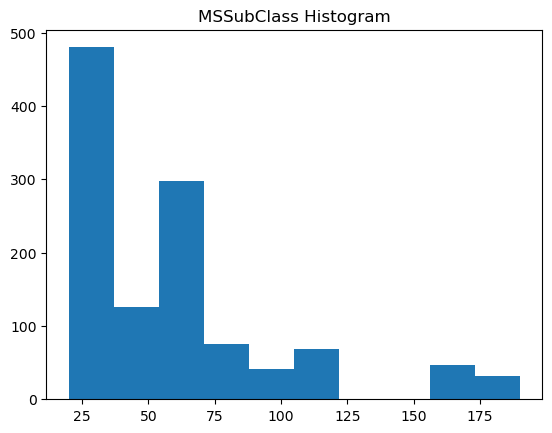

In [4]:
plt.hist(hdf['MSSubClass'],bins=10)
plt.title('MSSubClass Histogram')
plt.show()

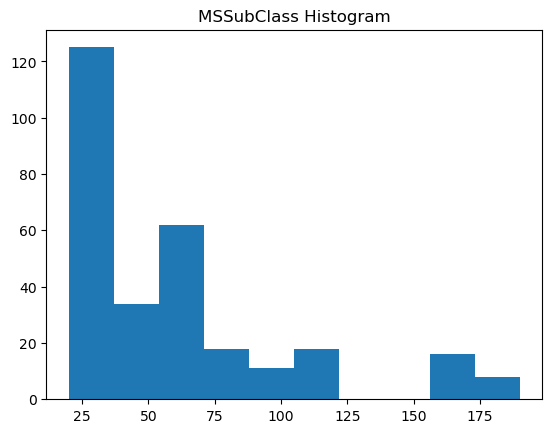

In [10]:
plt.hist(hdf1['MSSubClass'],bins=10)
plt.title('MSSubClass Histogram')
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x207a5265850>,
 'caps': [<matplotlib.lines.Line2D at 0x207a5265e20>,
 'boxes': [<matplotlib.lines.Line2D at 0x207a5265580>],
 'medians': [<matplotlib.lines.Line2D at 0x207a5274400>],
 'fliers': [<matplotlib.lines.Line2D at 0x207a52746d0>],
 'means': []}

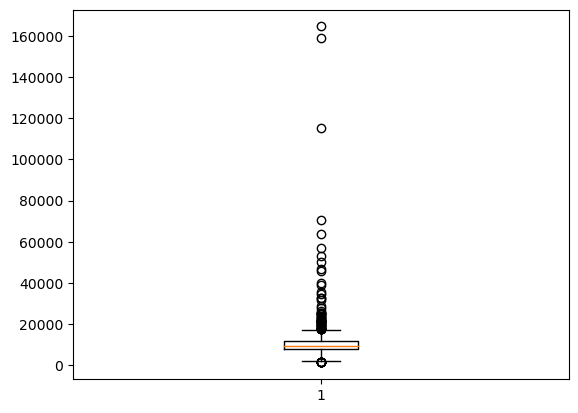

In [13]:
plt.boxplot(hdf['LotArea'])

<AxesSubplot:xlabel='SalePrice', ylabel='count'>

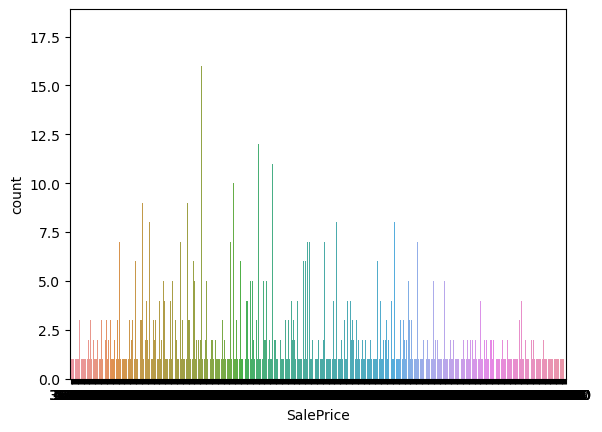

In [15]:
sns.countplot(hdf['SalePrice'])

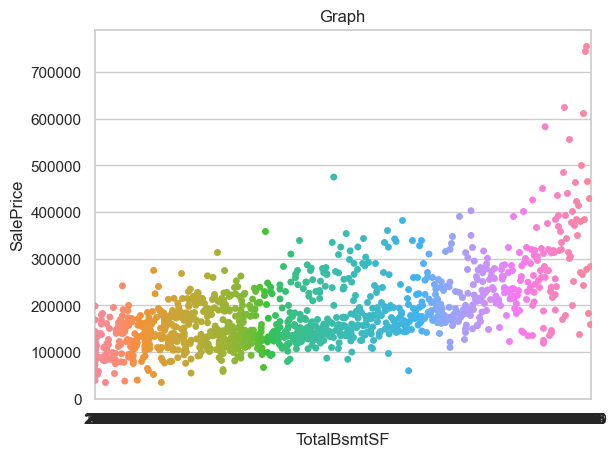

In [17]:
sns.set(style="whitegrid")
ax=sns.stripplot(x='TotalBsmtSF',y='SalePrice',data=hdf)
plt.title('Graph')
plt.show()

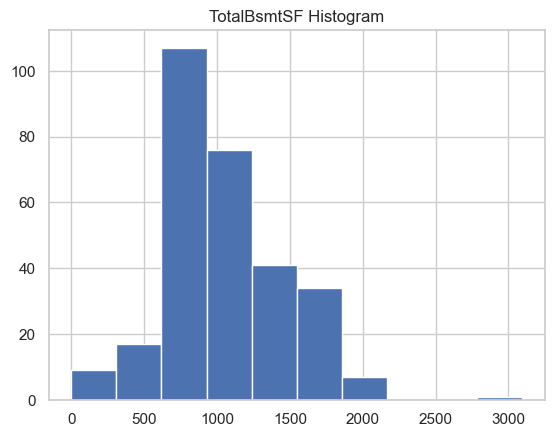

In [18]:
plt.hist(hdf1['TotalBsmtSF'],bins=10)
plt.title('TotalBsmtSF Histogram')
plt.show()

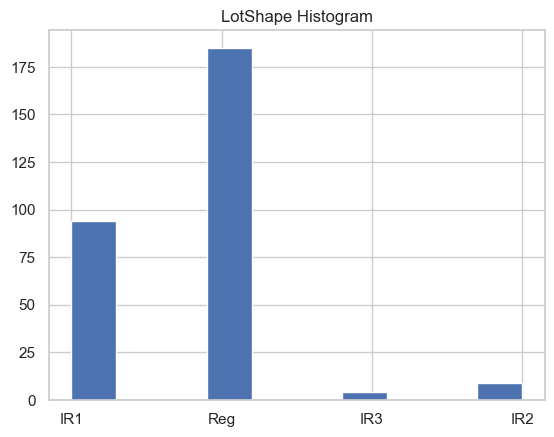

In [19]:
plt.hist(hdf1['LotShape'],bins=10)
plt.title('LotShape Histogram')
plt.show()

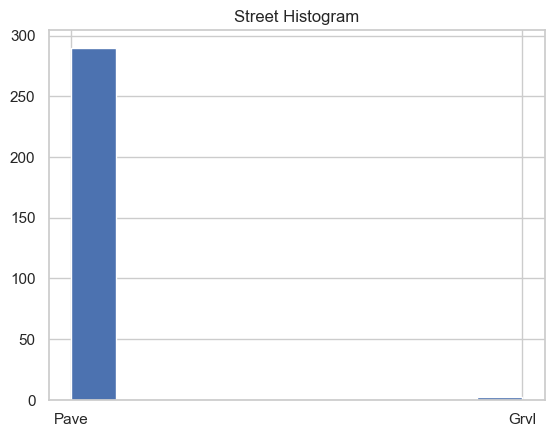

In [20]:
plt.hist(hdf1['Street'],bins=10)
plt.title('Street Histogram')
plt.show()

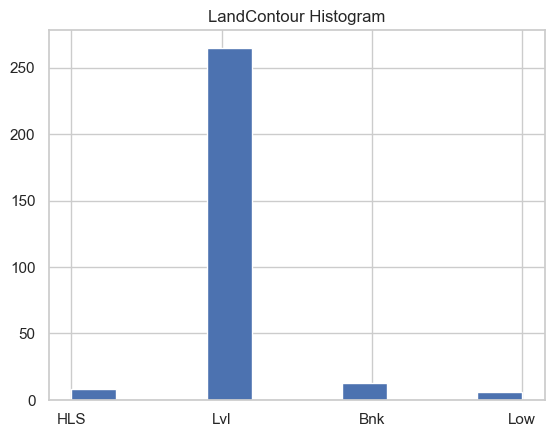

In [21]:
plt.hist(hdf1['LandContour'],bins=10)
plt.title('LandContour Histogram')
plt.show()

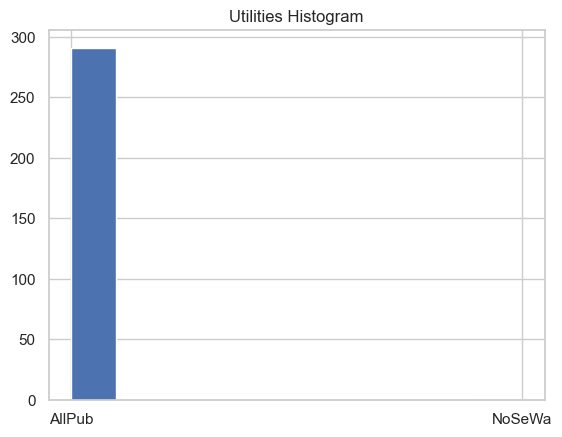

In [22]:
plt.hist(hdf1['Utilities'],bins=10)
plt.title('Utilities Histogram')
plt.show()

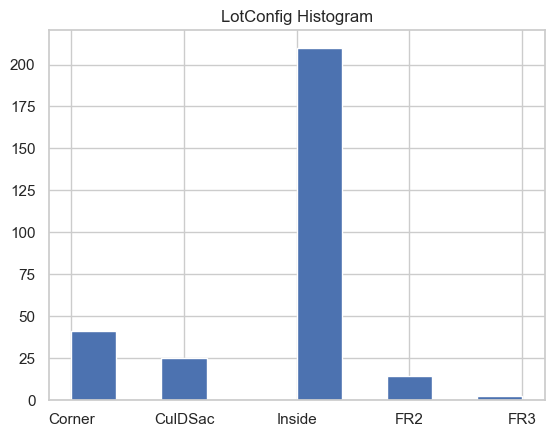

In [23]:
plt.hist(hdf1['LotConfig'],bins=10)
plt.title('LotConfig Histogram')
plt.show()

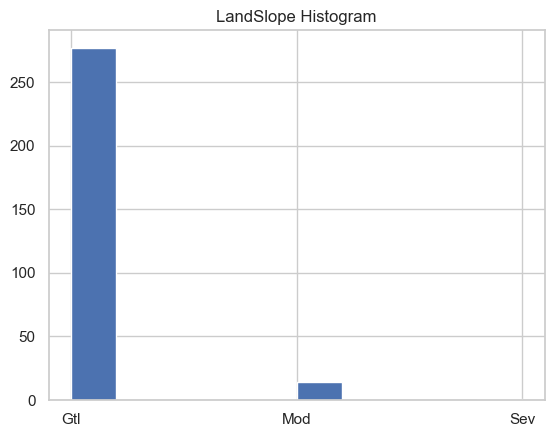

In [24]:
plt.hist(hdf1['LandSlope'],bins=10)
plt.title('LandSlope Histogram')
plt.show()

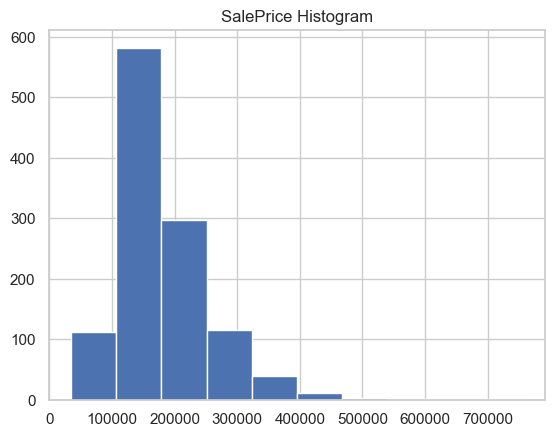

In [26]:
plt.hist(hdf['SalePrice'],bins=10)
plt.title('SalePrice Histogram')
plt.show()

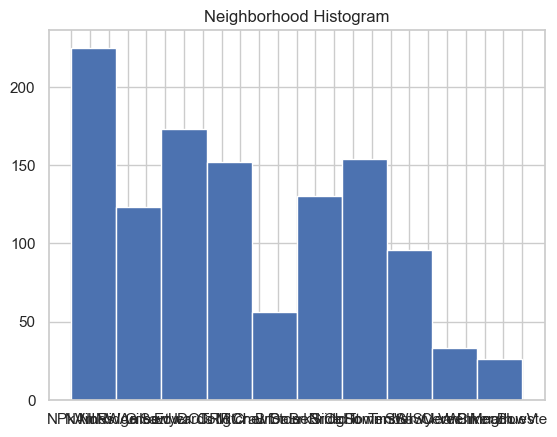

In [29]:
plt.hist(hdf['Neighborhood'],bins=10)
plt.title('Neighborhood Histogram')
plt.show()

In [30]:
sns.pairplot(hdf)

In [34]:
hdf['MSSubClass'].unique()

array([120,  20,  60,  50,  70,  30, 160,  85,  45,  90,  40,  80, 190,
        75, 180], dtype=int64)

In [31]:
hdf['MSSubClass'].nunique()

15

In [35]:
hdf['MSZoning'].unique()

array(['RL', 'RM', 'FV', 'RH', 'C (all)'], dtype=object)

In [32]:
hdf['MSZoning'].nunique()

5

In [37]:
hdf['LotFrontage'].unique()

array([ nan,  95.,  92., 105.,  58.,  88.,  70.,  80.,  50.,  44., 129.,
        59.,  55.,  64.,  24.,  68.,  71.,  74.,  61.,  60., 120.,  84.,
       141.,  30.,  65.,  76., 100.,  85.,  75., 107., 122.,  82.,  62.,
        73.,  79.,  77.,  41.,  69.,  90.,  96.,  72.,  34.,  78.,  63.,
        40.,  98., 160., 108., 128.,  51.,  81.,  99.,  66.,  37., 174.,
        87.,  53., 152.,  47.,  86.,  56.,  89.,  35.,  52.,  21., 104.,
        57.,  83.,  46., 101., 112., 149.,  93.,  49.,  43., 130.,  54.,
        91.,  67.,  97., 110., 103., 115.,  94.,  48.,  36., 313., 109.,
       144., 121., 102., 116., 182.,  32.,  42., 168., 118.,  38., 140.,
       134., 114., 124.,  39., 111.,  45., 106., 153.])

In [38]:
hdf['LotFrontage'].nunique()

106

In [39]:
hdf['LotArea'].unique()

array([  4928,  15865,   9920,  11751,  16635,  14054,  11341,  13125,
         9170,   8480,   8600,   9548,   9196,   8892,  16466,  10592,
         5890,   7314,   7917,   2016,  12435,   8445,   9717,  10659,
         9230,  21000,  25339,  11394,   6380,  11988,   7658,   3378,
        18890,  12358,  14762,  10356,  10400,  12615,   7540,   9100,
        31770,  13300,   3180,   2522,   8385,   8314,   8123,  12000,
         5000,   7931,  14331,  10440,   8400,   8712,  11100,   9742,
        19900,  10186,   8765,  11923,   7200,   7838,   7024,  11287,
         8834,   5500,   9858,  32668,   8760,   8366,   9158,   6780,
         9020,   4270,  10637,  10410,  13891,  16196,   8990,   8635,
         9786,  10010,   7950,   6180,   8461,   7642,   9600,   9240,
         9525,   4923,  11075,   6820,   9204,   8973,   8125,   5330,
         5868,  11250,  22950,  11308,  10500,  13600,  10152,   4590,
         6960,  14803,   9317, 115149,   7259,   7700,   7500,  13031,
      

In [40]:
hdf['LotArea'].nunique()

892

In [41]:
hdf['Street'].unique()

array(['Pave', 'Grvl'], dtype=object)

In [42]:
hdf['Street'].nunique()

2

In [43]:
hdf['LotShape'].unique()

array(['IR1', 'Reg', 'IR2', 'IR3'], dtype=object)

In [44]:
hdf['LotShape'].nunique()

4

In [45]:
hdf['LandContour'].unique()

array(['Lvl', 'Bnk', 'HLS', 'Low'], dtype=object)

In [46]:
hdf['LandContour'].nunique()

4

In [47]:
hdf['Utilities'].unique()

array(['AllPub'], dtype=object)

In [48]:
hdf['Utilities'].nunique()

1

In [49]:
hdf['LotConfig'].unique()

array(['Inside', 'CulDSac', 'FR2', 'Corner', 'FR3'], dtype=object)

In [50]:
hdf['LotConfig'].nunique()

5

In [51]:
hdf['LandSlope'].unique()

array(['Gtl', 'Mod', 'Sev'], dtype=object)

In [52]:
hdf['LandSlope'].nunique()

3

In [53]:
hdf['Neighborhood'].unique()

array(['NPkVill', 'NAmes', 'NoRidge', 'NWAmes', 'Gilbert', 'Sawyer',
       'Edwards', 'IDOTRR', 'CollgCr', 'Mitchel', 'Crawfor', 'BrDale',
       'StoneBr', 'BrkSide', 'NridgHt', 'OldTown', 'Somerst', 'Timber',
       'SWISU', 'SawyerW', 'ClearCr', 'Veenker', 'Blmngtn', 'MeadowV',
       'Blueste'], dtype=object)

In [54]:
hdf['Neighborhood'].nunique()

25

In [55]:
hdf['Condition1'].unique()

array(['Norm', 'Feedr', 'RRAn', 'PosA', 'RRAe', 'Artery', 'PosN', 'RRNe',
       'RRNn'], dtype=object)

In [56]:
hdf['Condition1'].nunique()

9

In [57]:
hdf['Condition2'].unique()

array(['Norm', 'RRAe', 'Feedr', 'PosN', 'Artery', 'RRNn', 'PosA', 'RRAn'],
      dtype=object)

In [58]:
hdf['Condition2'].nunique()

8

In [59]:
hdf['BldgType'].unique()

array(['TwnhsE', '1Fam', 'Duplex', 'Twnhs', '2fmCon'], dtype=object)

In [60]:
hdf['BldgType'].nunique()

5

In [61]:
hdf['HouseStyle'].unique()

array(['1Story', '2Story', '1.5Fin', 'SFoyer', '1.5Unf', 'SLvl', '2.5Fin',
       '2.5Unf'], dtype=object)

In [62]:
hdf['HouseStyle'].nunique()

8

In [63]:
hdf['OverallQual'].unique()

array([ 6,  8,  7,  5,  9,  1,  2,  4,  3, 10], dtype=int64)

In [64]:
hdf['OverallQual'].nunique()

10

In [65]:
hdf['OverallCond'].unique()

array([5, 6, 7, 4, 8, 2, 3, 9, 1], dtype=int64)

In [66]:
hdf['OverallCond'].nunique()

9

In [67]:
hdf['Exterior1st'].unique()

array(['Plywood', 'Wd Sdng', 'MetalSd', 'CemntBd', 'VinylSd', 'HdBoard',
       'Stucco', 'WdShing', 'BrkFace', 'Stone', 'AsbShng', 'AsphShn',
       'ImStucc', 'BrkComm'], dtype=object)

In [68]:
hdf['Exterior1st'].nunique()

14

In [69]:
hdf['SalePrice'].unique()

array([128000, 268000, 269790, 190000, 215000, 219210, 121500, 155000,
       140000, 118500, 119500, 237000, 201000, 126500, 135500, 165000,
       120500, 194500, 148000, 106000, 231500, 133000, 142125, 136500,
       146000, 217000, 112000, 394432, 113000, 188700, 319900, 135000,
       128500, 169000, 122000, 152000, 243000, 156000,  79500, 132000,
       144152, 130000, 149900, 124500, 179000, 147000,  39300, 312500,
       256000,  60000, 153000,  84900, 230000, 180000, 106500, 239000,
       107500, 123000, 176000, 228500, 117500, 350000, 200624, 173000,
       225000,  84500, 174900,  79000, 297000,  87000, 465000, 204900,
       127000, 159000, 170000, 159500, 102000, 109500, 163990, 189950,
       119000, 157500, 287000, 144000, 286000, 172000, 212000, 124000,
       150000, 205950, 251000, 129000, 223500, 475000, 335000, 115000,
       205000, 209500, 176432, 171000, 302000, 259500, 141000, 187500,
       385000, 275000, 108000,  89500, 109900, 185000, 143000, 127500,
      

In [71]:
hdf['SalePrice'].nunique()

581

Id                  AxesSubplot(0.125,0.747241;0.065678x0.132759)
MSSubClass       AxesSubplot(0.203814,0.747241;0.065678x0.132759)
LotFrontage      AxesSubplot(0.282627,0.747241;0.065678x0.132759)
LotArea          AxesSubplot(0.361441,0.747241;0.065678x0.132759)
OverallQual      AxesSubplot(0.440254,0.747241;0.065678x0.132759)
OverallCond      AxesSubplot(0.519068,0.747241;0.065678x0.132759)
YearBuilt        AxesSubplot(0.597881,0.747241;0.065678x0.132759)
YearRemodAdd     AxesSubplot(0.676695,0.747241;0.065678x0.132759)
MasVnrArea       AxesSubplot(0.755508,0.747241;0.065678x0.132759)
BsmtFinSF1       AxesSubplot(0.834322,0.747241;0.065678x0.132759)
BsmtFinSF2          AxesSubplot(0.125,0.587931;0.065678x0.132759)
BsmtUnfSF        AxesSubplot(0.203814,0.587931;0.065678x0.132759)
TotalBsmtSF      AxesSubplot(0.282627,0.587931;0.065678x0.132759)
1stFlrSF         AxesSubplot(0.361441,0.587931;0.065678x0.132759)
2ndFlrSF         AxesSubplot(0.440254,0.587931;0.065678x0.132759)
LowQualFin

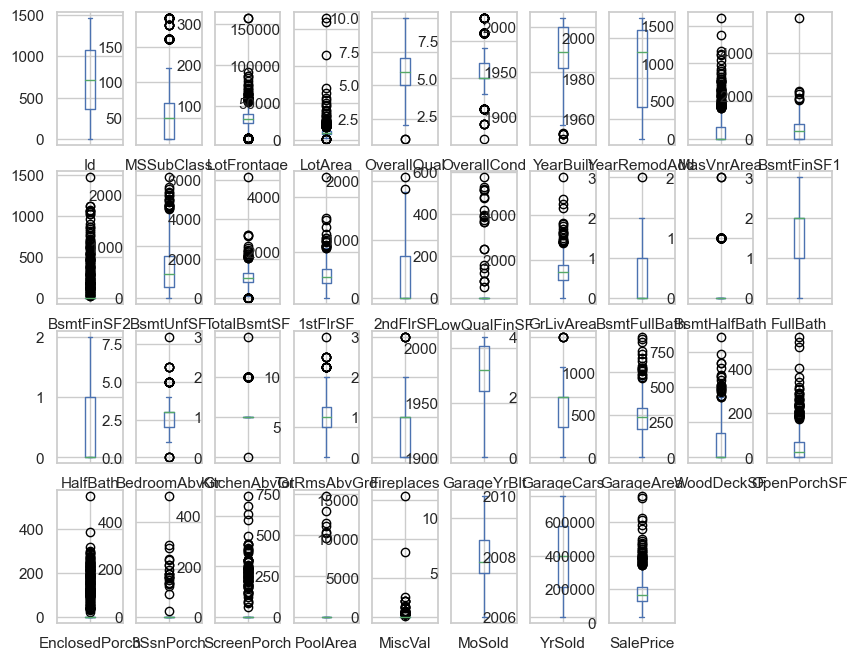

In [76]:
hdf.plot(kind='box',subplots=True,layout=(5,10),figsize=(10,10))

Id                  AxesSubplot(0.125,0.747241;0.065678x0.132759)
MSSubClass       AxesSubplot(0.203814,0.747241;0.065678x0.132759)
LotFrontage      AxesSubplot(0.282627,0.747241;0.065678x0.132759)
LotArea          AxesSubplot(0.361441,0.747241;0.065678x0.132759)
OverallQual      AxesSubplot(0.440254,0.747241;0.065678x0.132759)
OverallCond      AxesSubplot(0.519068,0.747241;0.065678x0.132759)
YearBuilt        AxesSubplot(0.597881,0.747241;0.065678x0.132759)
YearRemodAdd     AxesSubplot(0.676695,0.747241;0.065678x0.132759)
MasVnrArea       AxesSubplot(0.755508,0.747241;0.065678x0.132759)
BsmtFinSF1       AxesSubplot(0.834322,0.747241;0.065678x0.132759)
BsmtFinSF2          AxesSubplot(0.125,0.587931;0.065678x0.132759)
BsmtUnfSF        AxesSubplot(0.203814,0.587931;0.065678x0.132759)
TotalBsmtSF      AxesSubplot(0.282627,0.587931;0.065678x0.132759)
1stFlrSF         AxesSubplot(0.361441,0.587931;0.065678x0.132759)
2ndFlrSF         AxesSubplot(0.440254,0.587931;0.065678x0.132759)
LowQualFin

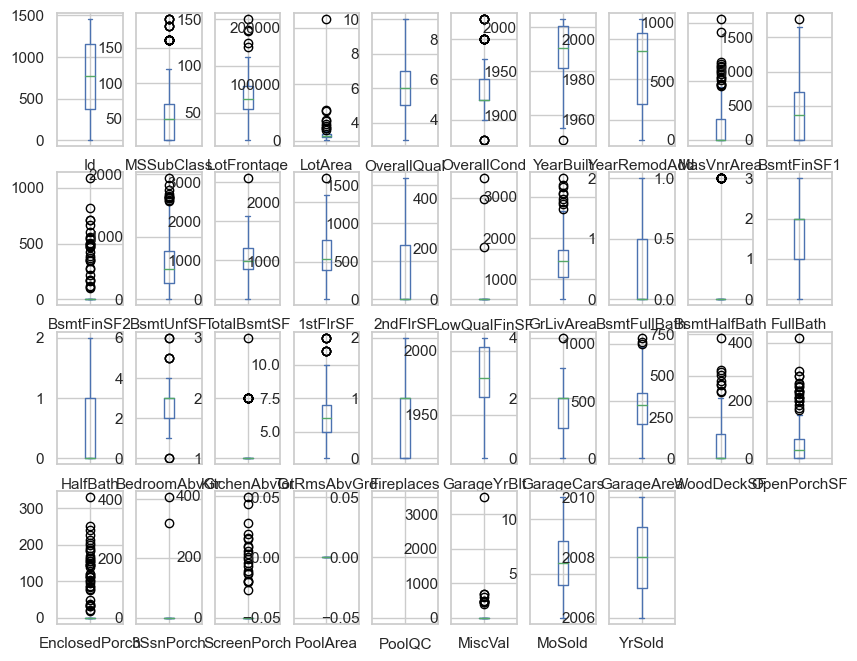

In [77]:
hdf1.plot(kind='box',subplots=True,layout=(5,10),figsize=(10,10))

<AxesSubplot:>

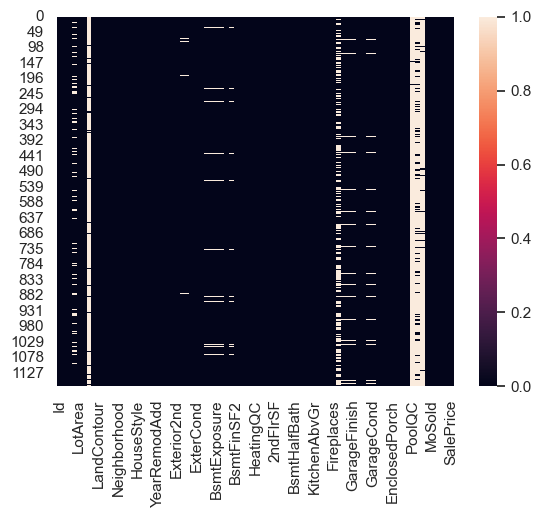

In [78]:
sns.heatmap(hdf.isnull())

In [5]:
hdf.isnull()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,True,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
4,False,False,False,True,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,False,False,False,True,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
1164,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
1165,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
1166,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,False,False,False


In [17]:
hdf.shape

(1168, 81)

In [29]:
hdf.isnull()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1164,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1165,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1166,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [7]:
hdf.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [23]:
hdf['LotFrontage'].replace(np.NaN,hdf['LotFrontage'].mean,inplace=True)

In [24]:
hdf['Alley'].replace(np.NaN,hdf['Alley'].mode,inplace=True)

In [25]:
hdf['PoolQC'].replace(np.NaN,hdf['PoolQC'].mode,inplace=True)

In [26]:
hdf['Fence'].replace(np.NaN,hdf['Fence'].mode,inplace=True)

In [27]:
hdf['MiscFeature'].replace(np.NaN,hdf['MiscFeature'].mode,inplace=True)

In [28]:
hdf.shape

(1168, 81)

In [30]:
hdf.isnull()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1164,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1165,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1166,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


<AxesSubplot:>

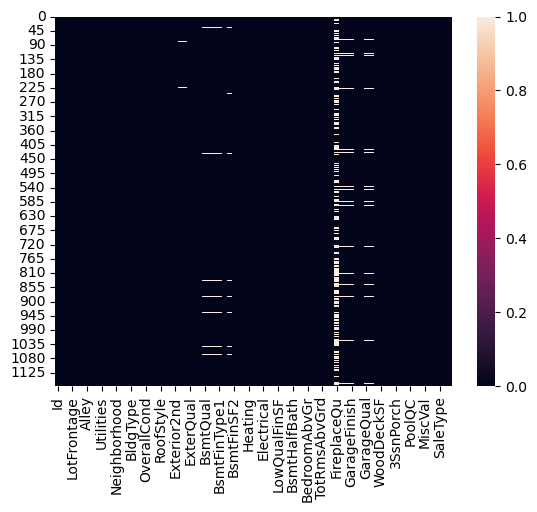

In [31]:
sns.heatmap(hdf.isnull())

In [13]:
hdf.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64

In [18]:
hdf1['LotFrontage'].replace(np.NaN,hdf1['LotFrontage'].mean,inplace=True)

In [19]:
hdf1['Alley'].replace(np.NaN,hdf1['Alley'].mode,inplace=True)

In [20]:
hdf1['PoolQC'].replace(np.NaN,hdf1['PoolQC'].mode,inplace=True)

In [21]:
hdf1['Fence'].replace(np.NaN,hdf1['Fence'].mode,inplace=True)

In [22]:
hdf1['MiscFeature'].replace(np.NaN,hdf1['MiscFeature'].mode,inplace=True)

In [10]:
hdf1.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 80, dtype: int64

In [10]:
hdf.dropna(inplace=True)

In [11]:
hdf.isnull().sum()

Id               0.0
MSSubClass       0.0
MSZoning         0.0
LotFrontage      0.0
LotArea          0.0
                ... 
MoSold           0.0
YrSold           0.0
SaleType         0.0
SaleCondition    0.0
SalePrice        0.0
Length: 81, dtype: float64

In [13]:
hdf

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [ ]:
df.drop('volatile acidity',axis=1,inplace=True)

In [4]:
imp=SimpleImputer(strategy="most_frequent")
hdf['LotFrontage',]=imp.fit_transform(hdf['LotFrontage'].values.reshape(-1,1))
hdf

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,"(LotFrontage,)"
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2007,WD,Normal,128000,60.0
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,10,2007,WD,Normal,268000,95.0
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,6,2007,WD,Normal,269790,92.0
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000,105.0
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,6,2009,WD,Normal,215000,60.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000,60.0
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000,67.0
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,7,2009,WD,Normal,148500,24.0
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000,50.0


In [5]:
le=LabelEncoder()
hdf['MSZoning']=le.fit_transform(hdf['MSZoning'])
list1=['MSZoning','Street','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','MasVnrArea','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual','Functional','FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond','PavedDrive','Fence','MiscFeature','SaleType','SaleCondition']
for val in list1:
    hdf[val]=le.fit_transform(hdf[val].astype(str))
hdf

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,"(LotFrontage,)"
0,127,120,3,NaN,4928,1,NaN,0,3,0,...,NaN,4,4,0,2,2007,8,4,128000,60.0
1,889,20,3,95.0,15865,1,NaN,0,3,0,...,NaN,4,4,0,10,2007,8,4,268000,95.0
2,793,60,3,92.0,9920,1,NaN,0,3,0,...,NaN,4,4,0,6,2007,8,4,269790,92.0
3,110,20,3,105.0,11751,1,NaN,0,3,0,...,NaN,2,4,0,1,2010,0,4,190000,105.0
4,422,20,3,NaN,16635,1,NaN,0,3,0,...,NaN,4,4,0,6,2009,8,4,215000,60.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,3,NaN,9819,1,NaN,0,3,0,...,NaN,2,4,0,2,2010,8,4,122000,60.0
1164,554,20,3,67.0,8777,1,NaN,3,3,0,...,NaN,2,4,0,5,2009,8,4,108000,67.0
1165,196,160,3,24.0,2280,1,NaN,3,3,0,...,NaN,4,4,0,7,2009,8,4,148500,24.0
1166,31,70,0,50.0,8500,1,Pave,3,3,0,...,NaN,2,4,0,7,2008,8,4,40000,50.0


In [5]:
hdf['LotFrontage'].replace(np.NaN,hdf['LotFrontage'].mean,inplace=True)

In [ ]:
hdf

In [12]:
z=np.abs(zscore(hdf))
z

array([], shape=(0, 81), dtype=float64)